In [675]:
!pip install pandas matplotlib scikit-learn numpy plotly imblearn

In [676]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.preprocessing import (
    LabelEncoder,
    StandardScaler
)
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc

### 2. Описание данных
Dataset: [NASA | Nearest Earth Objects (1910-2024)](https://www.kaggle.com/datasets/ivansher/nasa-nearest-earth-objects-1910-2024)

В космосе много опасных тел, одно из них - N.E.O. - "Ближайшие земные объекты". Некоторые такие тела действительно представляют опасность для планеты Земля, NASA классифицирует их как "is_hazardous". Этот набор данных содержит ВСЕ наблюдения NASA за подобными объектами с 1910 по 2024 год.

+ **neo_id**: уникальный идентификатор для каждого астероида.
+ **name**: название астероида.
+ **absolute_magnitude**: описывает внутреннюю светимость.
+ **estimated_diameter_min**: минимальный расчетный диаметр в километрах.
+ **estimated_diameter_max**: максимальный расчетный диаметр в километрах.
+ **orbiting_body**: планета, вокруг которой вращается астероид.
+ **relative_velocity**: скорость относительно планеты в км/ч.
+ **miss_distance**: пропущенное расстояние в километрах.
+ **is_hazardous**: логическая переменная, которая показывает, является ли астероид опасным или нет.

# Задание 1. Предварительная подготовка данных

In [679]:
# Загрузка данных
data = pd.read_csv('data/nearest_earth_objects.csv')

In [680]:
data.head(20)

,neo_id,name,absolute_magnitude,estimated_diameter_min,estimated_diameter_max,orbiting_body,relative_velocity,miss_distance,is_hazardous
0,2162117,162117 (1998 SD15),19.14,0.394962,0.883161,Earth,71745.401048,5.814362e+07,False
1,2349507,349507 (2008 QY),18.50,0.530341,1.185878,Earth,109949.757148,5.580105e+07,True
2,2455415,455415 (2003 GA),21.45,0.136319,0.304818,Earth,24865.506798,6.720689e+07,False
3,3132126,(2002 PB),20.63,0.198863,0.444672,Earth,78890.076805,3.039644e+07,False
4,3557844,(2011 DW),22.70,0.076658,0.171412,Earth,56036.519484,6.311863e+07,False
5,3656926,(2014 BT8),25.00,0.026580,0.059435,Earth,47477.649832,4.290521e+07,False
6,3421513,(2008 OX1),21.50,0.133216,0.297879,Earth,57853.295346,2.727908e+07,True
7,3541504,(2010 OF101),19.75,0.298233,0.666868,Earth,46972.486794,6.997593e+07,False
8,3836942,(2018 YH),21.70,0.121494,0.271669,Earth,37424.548382,5.657727e+06,True
9,3892166,(2019 UP13),23.45,0.054269,0.121350,Earth,38524.867869,6.166118e+07,False


In [681]:
data.dtypes

neo_id                      int64
name                       object
absolute_magnitude        float64
estimated_diameter_min    float64
estimated_diameter_max    float64
orbiting_body              object
relative_velocity         float64
miss_distance             float64
is_hazardous                 bool
dtype: object

#### Проверка дубликатов

In [683]:
duplicates = data.duplicated().sum()
print(f'Количество дубликатов: {duplicates}')
if duplicates > 0:
    data.drop_duplicates(inplace=True)
    print('Дубликаты удалены.')

Количество дубликатов: 0


#### Заполнение пропусков

In [685]:
data.fillna({
    'absolute_magnitude': 0,
    'estimated_diameter_min': 0,
    'estimated_diameter_max': 0,
    'relative_velocity': 0,
    'miss_distance': 0,
    'orbiting_body': 'other'
}, inplace=True)

#### Построение графика количества значений по каждому классу

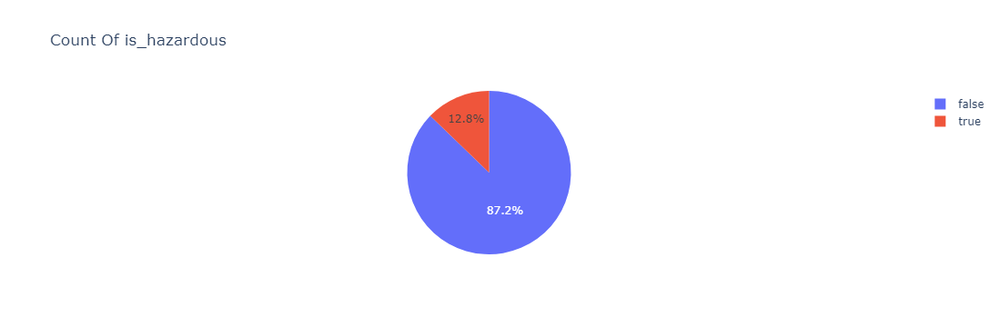

In [687]:
# График количества значений по классу is_hazardous
def is_hazardous_plot(_data):
    fig = px.pie(_data, names='is_hazardous', title='Count Of is_hazardous')
    fig.show()

is_hazardous_plot(data)

Видно, что у нас дисбаланс классов, который нужно исправить

#### Проверка уникальности значений

In [690]:
# посчитать количество уникальных значений
unique_counts = data.select_dtypes("object").nunique()
unique_counts

name             33514
orbiting_body        1
dtype: int64

#### Определение числовых и категориальных признаков. Заполнить пропуски в данных

In [692]:
# удалить идентификатор, так как он не несёт никакой полезной для нас информации
data.drop(columns=['neo_id'], inplace=True)
numerical_cols = data.select_dtypes(include=['float64', 'int']).columns
data[numerical_cols] = data[numerical_cols].fillna(0)
numerical_cols

Index(['absolute_magnitude', 'estimated_diameter_min',
       'estimated_diameter_max', 'relative_velocity', 'miss_distance'],
      dtype='object')

In [693]:
categorical_cols = data.select_dtypes(include=['object']).columns
data[categorical_cols] = data[categorical_cols].fillna('other')
categorical_cols

Index(['name', 'orbiting_body'], dtype='object')

#### Применить стандартизацию к числовым признакам и закодировать категориальные признаки

In [695]:
# Создание экземпляра StandardScaler
scaler = StandardScaler()

# Стандартизация числовых признаков
data[numerical_cols] = scaler.fit_transform(data[numerical_cols])
data[numerical_cols]

,absolute_magnitude,estimated_diameter_min,estimated_diameter_max,relative_velocity,miss_distance
0,-1.298800,0.755596,0.755596,0.783537,0.799476
1,-1.518087,1.186911,1.186911,2.230715,0.686711
2,-0.507314,-0.068436,-0.068436,-0.992271,1.235756
3,-0.788275,0.130831,0.130831,1.054176,-0.536196
4,-0.079021,-0.258515,-0.258515,0.188485,1.038958
...,...,...,...,...,...
338194,1.935672,-0.486459,-0.486459,0.211610,1.084537
338195,1.973362,-0.487264,-0.487264,-1.133742,-0.579886
338196,-0.346618,-0.152801,-0.152801,-1.485978,0.574057
338197,0.327687,-0.361361,-0.361361,0.194617,-1.749816


In [696]:
# Создание экземпляра LabelEncoder
label_encoder = LabelEncoder()

# Применение LabelEncoder к каждому категориальному столбцу
for col in categorical_cols:
    data[col] = label_encoder.fit_transform(data[col])

In [697]:
data.head(20)

,name,absolute_magnitude,estimated_diameter_min,estimated_diameter_max,orbiting_body,relative_velocity,miss_distance,is_hazardous
0,30603,-1.298800,0.755596,0.755596,0,0.783537,0.799476,False
1,31395,-1.518087,1.186911,1.186911,0,2.230715,0.686711,True
2,32118,-0.507314,-0.068436,-0.068436,0,-0.992271,1.235756,False
3,736,-0.788275,0.130831,0.130831,0,1.054176,-0.536196,False
4,4880,-0.079021,-0.258515,-0.258515,0,0.188485,1.038958,False
5,7484,0.709039,-0.418061,-0.418061,0,-0.135724,0.065941,False
6,2982,-0.490182,-0.078322,-0.078322,0,0.257304,-0.686257,True
7,4305,-1.089793,0.447419,0.447419,0,-0.154860,1.369050,False
8,15221,-0.421655,-0.115667,-0.115667,0,-0.516535,-1.727048,True
9,16520,0.177955,-0.329843,-0.329843,0,-0.474855,0.968801,False


#### Разделить на тренировочную и обучающую выборки

In [699]:
target_column = "is_hazardous"
features = ['absolute_magnitude', 'estimated_diameter_min', 'estimated_diameter_max', 'miss_distance', 'relative_velocity']
X = data[features]
y = data[target_column]

In [700]:
print(X.shape, y.shape)

(338199, 5) (338199,)


In [701]:
# Избавиться от дисбаланса классов
# SMOTE создает синтетические примеры, основываясь на существующих данных
smt = SMOTE()
X_resampled, y_resampled = smt.fit_resample(X, y)

In [702]:
print(X_resampled.shape, y_resampled.shape)

(590074, 5) (590074,)


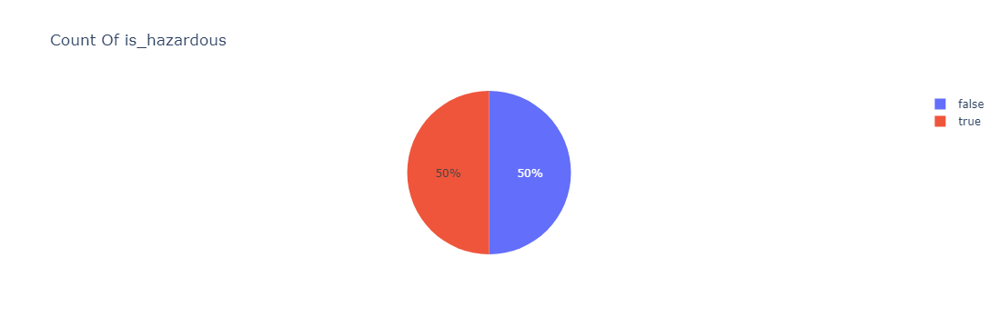

In [703]:
is_hazardous_plot(y_resampled)

In [704]:
X_train, X_test, y_train, y_test = train_test_split(
    X_resampled, y_resampled, test_size=0.25, stratify=y_resampled, random_state=42
)
X_train.head(2)

,absolute_magnitude,estimated_diameter_min,estimated_diameter_max,miss_distance,relative_velocity
105024,-0.277749,-0.183739,-0.183739,0.205042,0.704377
300963,-0.507314,-0.068436,-0.068436,-1.621476,-0.362116


In [705]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(442555, 5) (442555,)
(147519, 5) (147519,)


In [706]:
X_train.head()

,absolute_magnitude,estimated_diameter_min,estimated_diameter_max,miss_distance,relative_velocity
105024,-0.277749,-0.183739,-0.183739,0.205042,0.704377
300963,-0.507314,-0.068436,-0.068436,-1.621476,-0.362116
42570,0.914620,-0.438506,-0.438506,-0.716444,-0.361983
494681,-1.135985,0.508307,0.508307,1.208799,-0.785167
486174,-1.106925,0.469551,0.469551,0.304806,0.169440


In [707]:
X_test.head()

,absolute_magnitude,estimated_diameter_min,estimated_diameter_max,miss_distance,relative_velocity
17466,-2.227341,3.880526,3.880526,-0.144813,-1.179890
237894,-0.246912,-0.196691,-0.196691,0.501549,0.233182
358584,-0.805406,0.145589,0.145589,0.292275,-0.498754
420994,-1.226672,0.639576,0.639576,0.440870,1.845788
73710,-0.634089,0.012245,0.012245,0.042033,-1.257677


# Задание №2. Обучение модели логистической регрессии и вычисление метрик

In [709]:
def get_report(report):
    """Функция для вывода метрик"""
    print(f"Accuracy: {report['accuracy']:.2f}")
    print(f"Класс 1 (неопасные): Recall: {report['False']['recall']:.2f}, Precision: {report['False']['precision']:.2f}, F1-Score: {report['False']['f1-score']:.2f}")
    print(f"Класс 2 (опасные): Recall: {report['True']['recall']:.2f}, Precision: {report['True']['precision']:.2f}, F1-Score: {report['True']['f1-score']:.2f}")

In [710]:
# Инициализация модели логистической регрессии
model = LogisticRegression()

# Обучение модели на тренировочных данных
model.fit(X_train, y_train)

LogisticRegression()

In [711]:
# Предсказания на тренировочной выборке
y_train_pred = model.predict(X_train)

# Предсказания на тестовой выборке
y_test_pred = model.predict(X_test)

# Вычисление метрик для тренировочной выборки
train_report = classification_report(y_train, y_train_pred, output_dict=True)

# Вычисление метрик для тестовой выборки
test_report = classification_report(y_test, y_test_pred, output_dict=True)

# Вывод метрик
print("Метрики на тренировочной выборке:")
get_report(train_report)

print("\nМетрики на тестовой выборке:")
get_report(test_report)

Метрики на тренировочной выборке:
Accuracy: 0.80
Класс 1 (неопасные): Recall: 0.71, Precision: 0.86, F1-Score: 0.78
Класс 2 (опасные): Recall: 0.88, Precision: 0.75, F1-Score: 0.81

Метрики на тестовой выборке:
Accuracy: 0.80
Класс 1 (неопасные): Recall: 0.71, Precision: 0.86, F1-Score: 0.78
Класс 2 (опасные): Recall: 0.88, Precision: 0.76, F1-Score: 0.81


### Выводы: 
1. Модель демонстрирует стабильную точность 80% как на тренировочной, так и на тестовой выборках. Это указывает на то, что модель хорошо справляется с задачей классификации в целом.
2. Класс 1 (неопасные)
    * Модель правильно идентифицирует 71% всех примеров класса 1. Это может указывать на то, что есть место для улучшения в обнаружении неопасных объектов.
    * Высокий уровень точности означает, что среди всех объектов, классифицированных как класс 1, 86% действительно являются неопасными. Это говорит о том, что модель не слишком часто ошибается в своих предсказаниях для этого класса.
    * F1-Score 78% — это значение является гармоническим средним между Recall и Precision и подтверждает сбалансированность между этими метриками.
3. Класс 2 (опасные)
    * Модель хорошо справляется с выявлением опасных объектов, что является положительным моментом для задач, где важно не пропустить опасные случаи.
    * Precision 75% — хотя точность ниже по сравнению с классом 1, она все же достаточно приемлема. Это означает, что среди всех предсказанных опасных объектов 75% действительно являются таковыми.
    * F1-Score 81% — это значение подтверждает хорошую производительность модели для класса 2 и указывает на сбалансированность Recall и Precision.

# Задание №3. Настройка модели

In [714]:
def evaluate_model(_model, X_train, y_train, X_test, y_test):
    """Функция для обучения модели и оценки ее производительности"""
    
    # Обучение модели
    _model.fit(X_train, y_train)

    # Предсказания на тренировочной выборке
    y_train_pred = _model.predict(X_train)

    # Предсказания на тестовой выборке
    y_test_pred = _model.predict(X_test)

    # Вычисление метрик для тренировочной выборки
    train_report = classification_report(y_train, y_train_pred, output_dict=True)

    # Вычисление метрик для тестовой выборки
    test_report = classification_report(y_test, y_test_pred, output_dict=True)

    # Вывод метрик
    print("Метрики на тренировочной выборке:")
    get_report(train_report)

    print("\nМетрики на тестовой выборке:")
    get_report(test_report)

In [715]:
# Регуляризация L1
model_l1 = LogisticRegression(penalty='l1', solver='liblinear')
print("\n___Регуляризация L1___\n")
evaluate_model(model_l1, X_train, y_train, X_test, y_test)

# Регуляризация L2
model_l2 = LogisticRegression(penalty='l2', solver='liblinear')
print("\n___Регуляризация L2___\n")
evaluate_model(model_l2, X_train, y_train, X_test, y_test)

# Elastic Net (смешанная регуляризация)
model_en = LogisticRegression(penalty='elasticnet', solver='saga', l1_ratio=0.5)  # l1_ratio определяет соотношение L1 и L2
print("\n___Регуляризация Elastic Net___\n")
evaluate_model(model_en, X_train, y_train, X_test, y_test)


___Регуляризация L1___

Метрики на тренировочной выборке:
Accuracy: 0.80
Класс 1 (неопасные): Recall: 0.71, Precision: 0.86, F1-Score: 0.78
Класс 2 (опасные): Recall: 0.88, Precision: 0.75, F1-Score: 0.81

Метрики на тестовой выборке:
Accuracy: 0.80
Класс 1 (неопасные): Recall: 0.71, Precision: 0.86, F1-Score: 0.78
Класс 2 (опасные): Recall: 0.88, Precision: 0.76, F1-Score: 0.81

___Регуляризация L2___

Метрики на тренировочной выборке:
Accuracy: 0.80
Класс 1 (неопасные): Recall: 0.71, Precision: 0.86, F1-Score: 0.78
Класс 2 (опасные): Recall: 0.88, Precision: 0.75, F1-Score: 0.81

Метрики на тестовой выборке:
Accuracy: 0.80
Класс 1 (неопасные): Recall: 0.71, Precision: 0.86, F1-Score: 0.78
Класс 2 (опасные): Recall: 0.88, Precision: 0.76, F1-Score: 0.81

___Регуляризация Elastic Net___

Метрики на тренировочной выборке:
Accuracy: 0.80
Класс 1 (неопасные): Recall: 0.71, Precision: 0.86, F1-Score: 0.78
Класс 2 (опасные): Recall: 0.88, Precision: 0.75, F1-Score: 0.81

Метрики на тестово

### Вывод:
Все три модели (с L1, L2 и Elastic Net) показывают идентичные метрики как на тренировочной, так и на тестовой выборках. Это говорит о том, что выбранные методы регуляризации не влияют на качество модели в данном случае.

#### Построение ROC-кривой

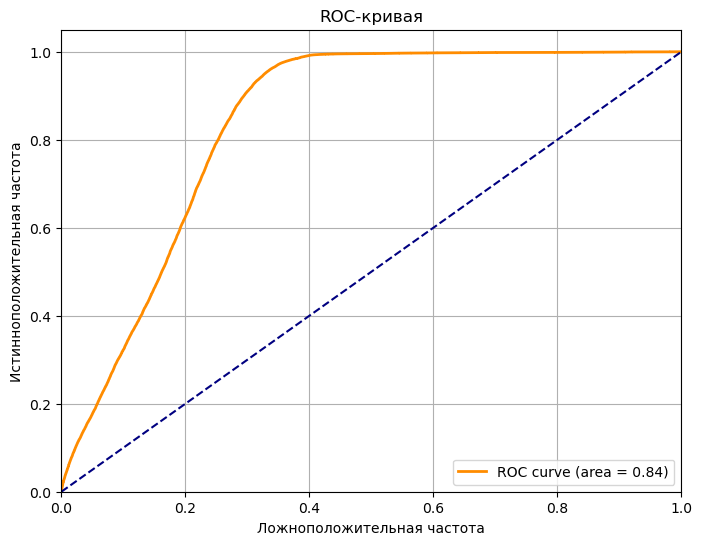

In [720]:
# Получение вероятностей предсказания для тестовой выборки
y_pred_proba = model.predict_proba(X_test)[:, 1]

# Вычисление TPR и FPR
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Вычисление AUC
roc_auc = auc(fpr, tpr)

# Построение ROC-кривой
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')  # Линия случайного угадывания
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Ложноположительная частота')
plt.ylabel('Истинноположительная частота')
plt.title('ROC-кривая')
plt.legend(loc="lower right")
plt.grid()
plt.show()

### Вывод:
График ROC-кривой позволяет визуально оценить качество классификатора. Чем ближе кривая к верхнему левому углу графика, тем лучше модель различает классы. Значение AUC (площадь под кривой) варьируется от 0 до 1. ь.
AUC = 1 означает идеальную мод Очень странно получается. но вот так :)ель.

# Задание №4. Настройка гиперпараметров модели

In [728]:
# Параметры для логистической регрессии
iterations = [100, 200, 300, 500]
C_values = [0.1, 0.5, 1.0, 3.0, 5.0]

for iters in iterations:
    for C in C_values:
        # Создание и обучение модели
        model = LogisticRegression(max_iter=iters, C=C)
        print(f"\n___Количество итераций {iters} и штраф {C}___\n")
        evaluate_model(model, X_train, y_train, X_test, y_test)


___Количество итераций 100 и штраф 0.1___

Метрики на тренировочной выборке:
Accuracy: 0.80
Класс 1 (неопасные): Recall: 0.71, Precision: 0.86, F1-Score: 0.78
Класс 2 (опасные): Recall: 0.88, Precision: 0.75, F1-Score: 0.81

Метрики на тестовой выборке:
Accuracy: 0.80
Класс 1 (неопасные): Recall: 0.71, Precision: 0.86, F1-Score: 0.78
Класс 2 (опасные): Recall: 0.88, Precision: 0.76, F1-Score: 0.81

___Количество итераций 100 и штраф 0.5___

Метрики на тренировочной выборке:
Accuracy: 0.80
Класс 1 (неопасные): Recall: 0.71, Precision: 0.86, F1-Score: 0.78
Класс 2 (опасные): Recall: 0.88, Precision: 0.75, F1-Score: 0.81

Метрики на тестовой выборке:
Accuracy: 0.80
Класс 1 (неопасные): Recall: 0.71, Precision: 0.86, F1-Score: 0.78
Класс 2 (опасные): Recall: 0.88, Precision: 0.76, F1-Score: 0.81

___Количество итераций 100 и штраф 1.0___

Метрики на тренировочной выборке:
Accuracy: 0.80
Класс 1 (неопасные): Recall: 0.71, Precision: 0.86, F1-Score: 0.78
Класс 2 (опасные): Recall: 0.88, Pre

### Выводы:
1. Все модели показывают одинаковые метрики на тренировочной и тестовой выборках, что указывает на хорошую обобщающую способность. Это может свидетельствовать о том, что модель не переобучается и хорошо справляется с задачей классификации.
2. Штрафы от 0.1 до 5.0: Независимо от значения штрафа, метрики остаются неизменными, что может указывать на то, что модель не чувствительна к изменениям штрафа в данном диапазоне. Это может быть связано с тем, что данные достаточно сбалансированы или что модель уже оптимизирована для текущих условий.